<a href="https://colab.research.google.com/github/benschwarz3/Spring-2023/blob/main/Math_Data_Copy_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
import torch.nn.functional as F
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import imageio as io

In [2]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(18, 10)
    plt.show()

In [3]:
image = io.imread("http://harborparkgarage.com/img/venues/pix/aquarium2.jpg")

In [4]:
image.shape #if 3 channels then RGB if 4 then RGBA

(599, 1024, 3)

In [5]:
image = image[:,:,0:3] #Remove the alpha channel if there

In [6]:
image.shape

(599, 1024, 3)

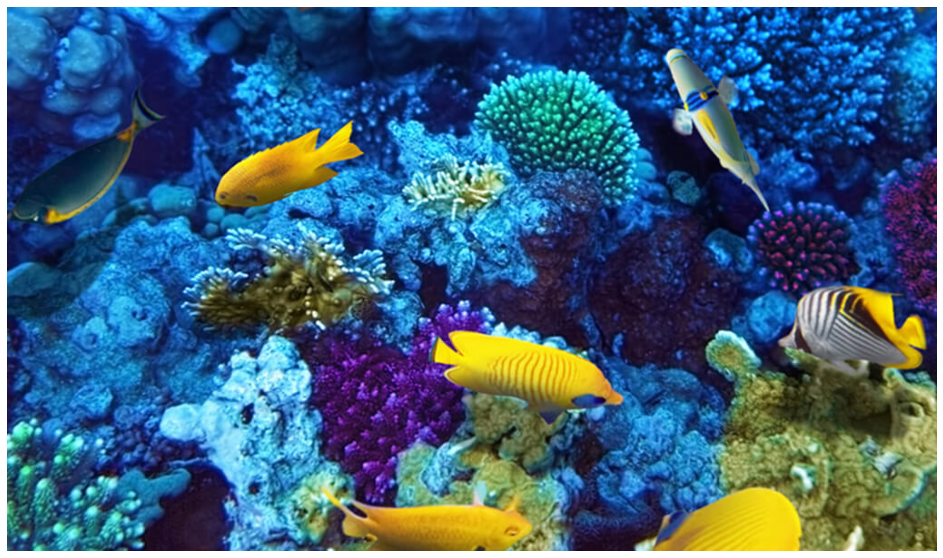

In [7]:
plot(image)

In [8]:
image

Array([[[ 16, 122, 200],
        [ 16, 122, 200],
        [ 16, 121, 202],
        ...,
        [  6,  80, 151],
        [  6,  80, 155],
        [  6,  79, 156]],

       [[ 18, 125, 205],
        [ 18, 125, 205],
        [ 17, 124, 206],
        ...,
        [ 10,  84, 157],
        [ 10,  83, 160],
        [ 10,  83, 162]],

       [[ 17, 128, 209],
        [ 17, 128, 209],
        [ 15, 126, 208],
        ...,
        [ 14,  87, 164],
        [ 13,  85, 167],
        [ 13,  85, 169]],

       ...,

       [[ 56, 125, 140],
        [ 52, 115, 130],
        [ 50, 101, 118],
        ...,
        [ 82,  78,  14],
        [ 70,  66,   3],
        [ 64,  59,   1]],

       [[ 58, 125, 141],
        [ 51, 113, 128],
        [ 44,  95, 112],
        ...,
        [ 89,  86,  19],
        [ 75,  71,   8],
        [ 70,  66,   5]],

       [[ 53, 119, 133],
        [ 45, 104, 118],
        [ 36,  85, 100],
        ...,
        [101,  98,  31],
        [ 82,  78,  15],
        [ 75,  71,  10]]

In [9]:
image_vector = image.flatten()

In [10]:
image_vector.shape

(1840128,)

In [11]:
image.shape

(599, 1024, 3)

In [12]:
image_vector.shape

(1840128,)

In [13]:
800*800*3

1920000

(array([387675., 320913., 253862., 210668., 177244., 135180., 112492.,
         86351.,  79315.,  76428.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 10 Patch objects>)

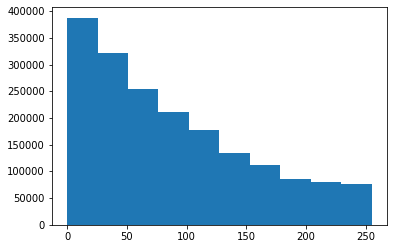

In [14]:
plt.hist(image_vector)

In [15]:
image = image.astype(float)/255.0

In [16]:
image

Array([[[0.0627451 , 0.47843137, 0.78431373],
        [0.0627451 , 0.47843137, 0.78431373],
        [0.0627451 , 0.4745098 , 0.79215686],
        ...,
        [0.02352941, 0.31372549, 0.59215686],
        [0.02352941, 0.31372549, 0.60784314],
        [0.02352941, 0.30980392, 0.61176471]],

       [[0.07058824, 0.49019608, 0.80392157],
        [0.07058824, 0.49019608, 0.80392157],
        [0.06666667, 0.48627451, 0.80784314],
        ...,
        [0.03921569, 0.32941176, 0.61568627],
        [0.03921569, 0.3254902 , 0.62745098],
        [0.03921569, 0.3254902 , 0.63529412]],

       [[0.06666667, 0.50196078, 0.81960784],
        [0.06666667, 0.50196078, 0.81960784],
        [0.05882353, 0.49411765, 0.81568627],
        ...,
        [0.05490196, 0.34117647, 0.64313725],
        [0.05098039, 0.33333333, 0.65490196],
        [0.05098039, 0.33333333, 0.6627451 ]],

       ...,

       [[0.21960784, 0.49019608, 0.54901961],
        [0.20392157, 0.45098039, 0.50980392],
        [0.19607843, 0

In [17]:
image.shape

(599, 1024, 3)

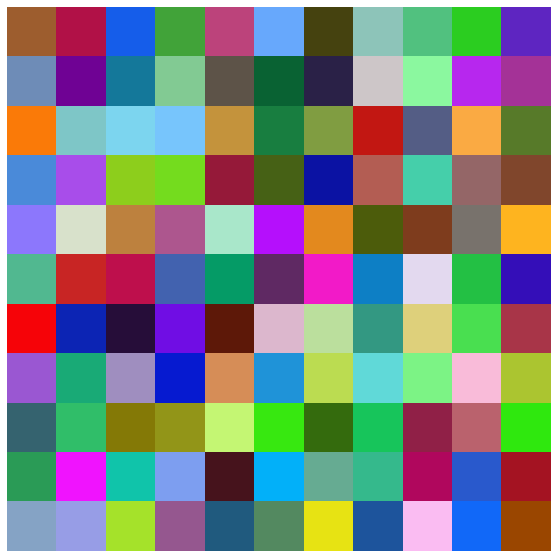

In [18]:
plot(np.random.random((11,11,3)))

In [19]:
filters = np.random.random((96,11,11,3))

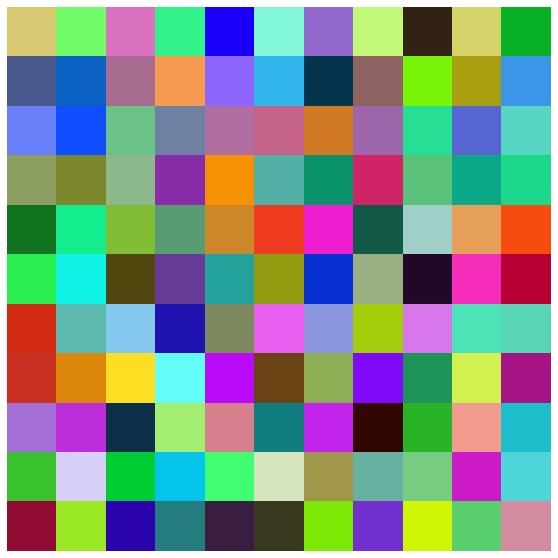

In [20]:
plot(filters[1,:,:,:])

In [21]:
f = np.random.random((11,11,3))

In [22]:
filters.shape

(96, 11, 11, 3)

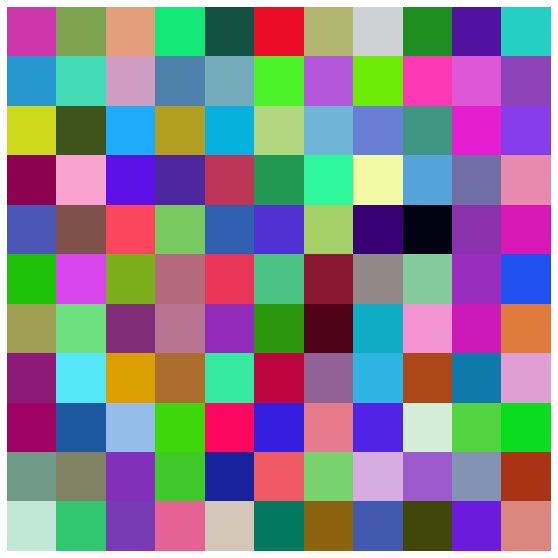

In [23]:
plot(filters[0])

In [24]:
image.shape

(599, 1024, 3)

In [25]:
f = np.random.random((11,11,3))

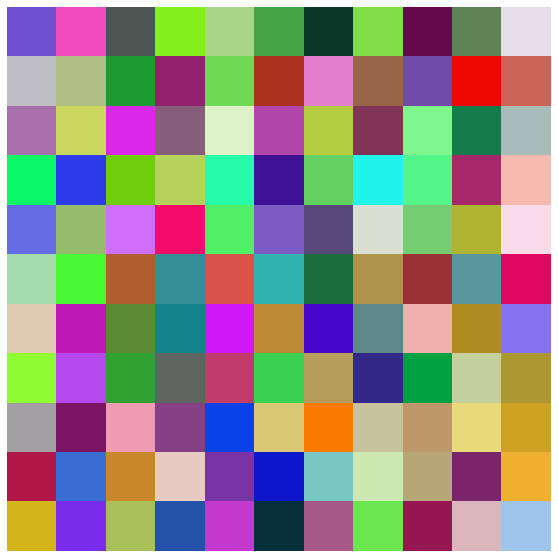

In [26]:
plot(f)

In [27]:
image = np.transpose(image, (2,0,1))

In [28]:
image.shape

(3, 599, 1024)

In [29]:
f = np.random.random((1,3,11,11)).astype(np.float32) #b,c,h,w

In [30]:
f.shape

(1, 3, 11, 11)

In [31]:
image.shape

(3, 599, 1024)

In [32]:
image = image[None,:,:,:]

In [33]:
image.shape

(1, 3, 599, 1024)

In [34]:
f.shape

(1, 3, 11, 11)

In [35]:
f = torch.tensor(f,dtype=torch.double)
image = torch.tensor(image,dtype=torch.double)

In [36]:
image = image /255.0

In [37]:
f.shape, image.shape

(torch.Size([1, 3, 11, 11]), torch.Size([1, 3, 599, 1024]))

In [38]:
image2 = F.conv2d(image,f)

In [39]:
image2.shape

torch.Size([1, 1, 589, 1014])

In [40]:
image2 = image2.numpy()

In [41]:
image2.shape

(1, 1, 589, 1014)

In [42]:
image2[0,0,:,:].shape

(589, 1014)

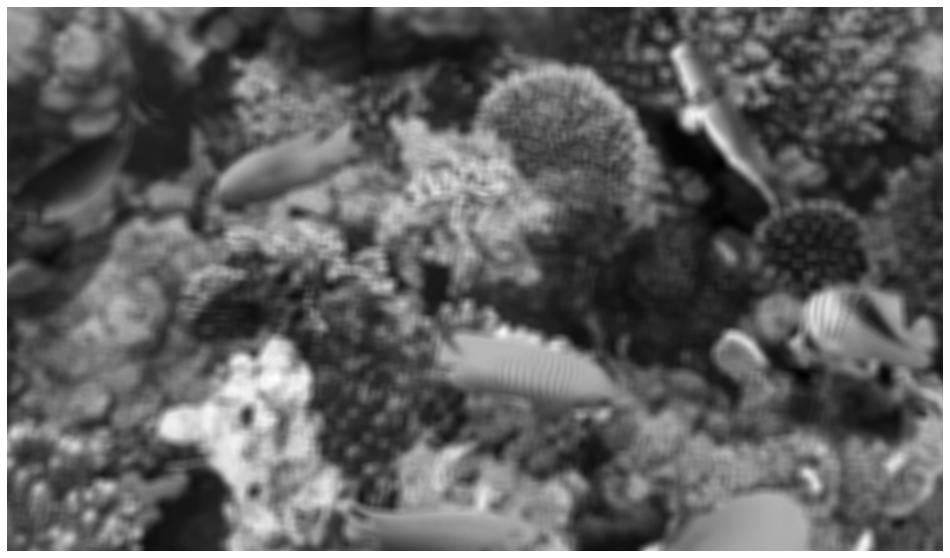

In [43]:
plot(image2[0,0,:,:])

In [44]:
####Mario#####

In [45]:
import imageio as io
import numpy as np

import matplotlib.pyplot as plt
from scipy import signal 

In [46]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(18, 10)
    plt.show()

In [47]:
def scale1(x):
    return (x-np.min(x))/(np.max(x)-np.min(x))

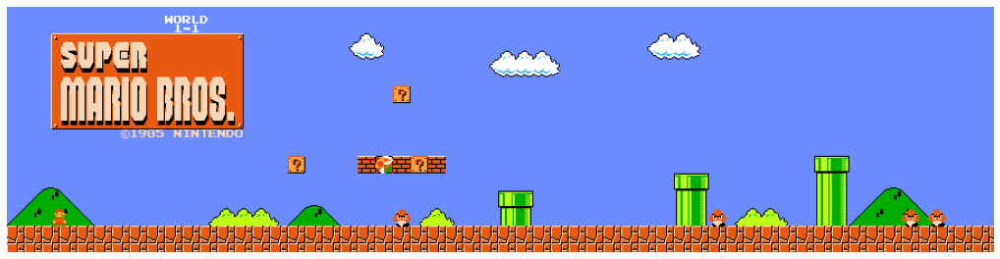

In [48]:
image = io.imread("http://selmiak.bplaced.net/games/nes/smb/img/1-1.gif")
image = image[:,0:900,:]
plot(image)

In [49]:
image.shape

(224, 900, 4)

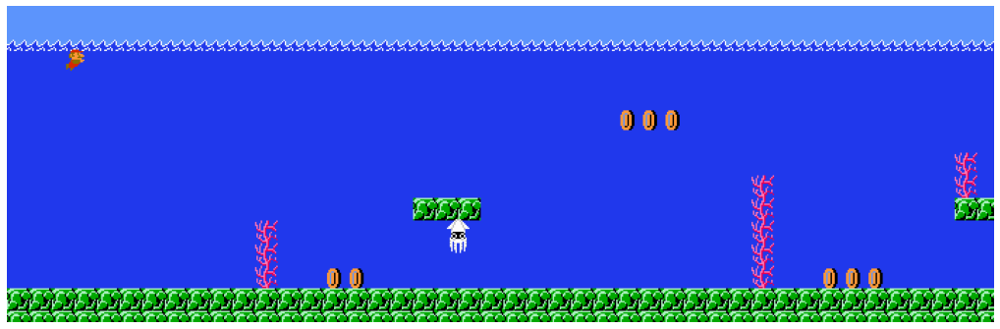

In [50]:
image = io.imread("http://ian-albert.com/games/super_mario_bros_maps/mario-2-2.gif")
image = image[:,0:700,:]
plot(image)

In [51]:
coin = image[185:200,224:239,:]

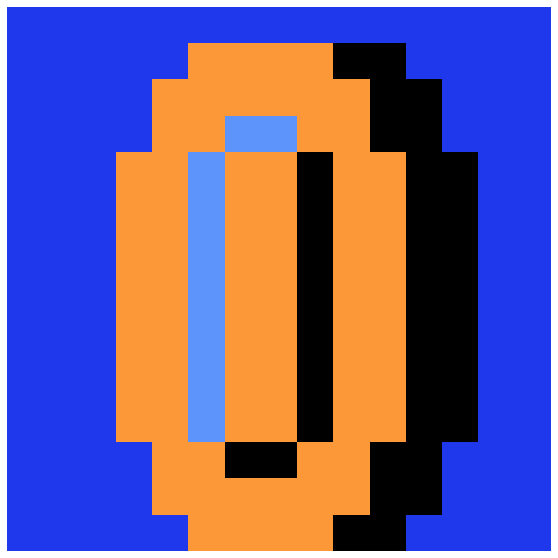

In [52]:
plot(coin)

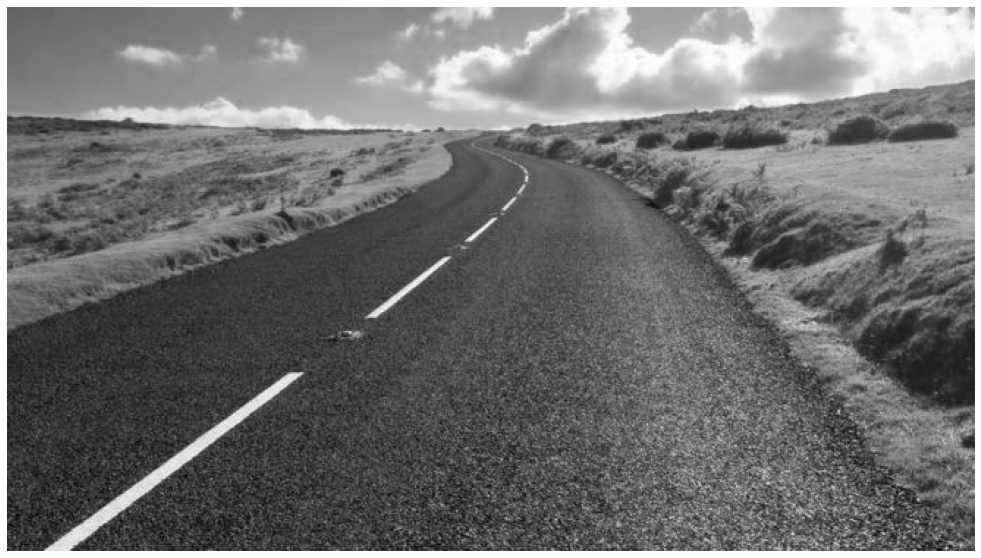

In [54]:
image = io.imread('https://tinyurl.com/roadimage101')
image = image[:,:,0]
image = image.astype(float)
image /= 255.00
plot(image)

In [55]:
image = image.copy

In [57]:
def rgb2gray(rgb):

    gray = 0.2989 * rgb[:,:,0] + 0.5870 * rgb[:,:,1] + 0.1140 * rgb[:,:,2]

    return gray

In [58]:
def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

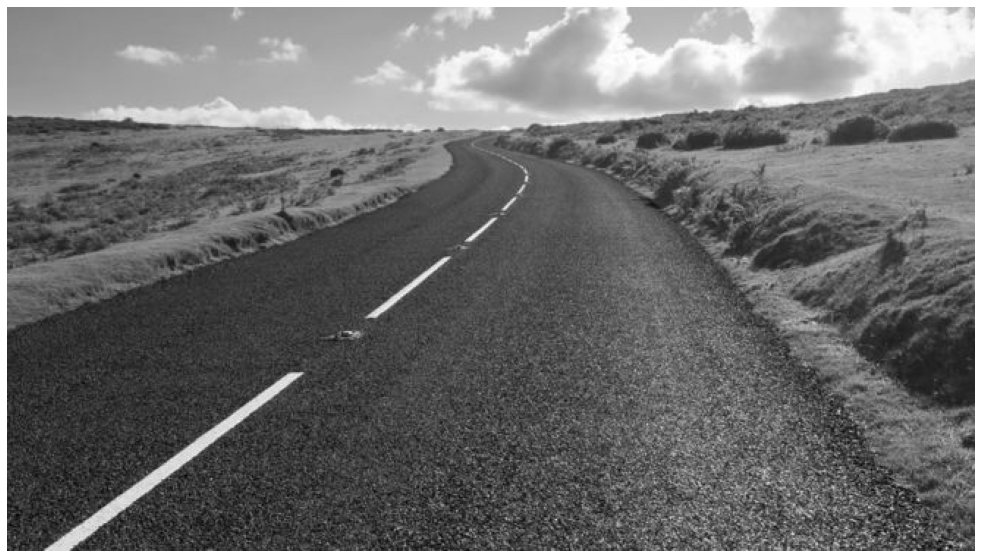

In [59]:
image = io.imread('https://tinyurl.com/roadimage101')
image = rgb2gray(image)
image = image.astype(float)
image /= 255.00
plot(image)

In [60]:
a = np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])

In [61]:
a

matrix([[ 1,  2,  1],
        [ 0,  0,  0],
        [-1, -2, -1]])

In [62]:
f=a

In [63]:
x=image

In [64]:
f

matrix([[ 1,  2,  1],
        [ 0,  0,  0],
        [-1, -2, -1]])

In [65]:
f[2,2]

-1

In [66]:
x2 = np.zeros(x.shape)

In [67]:
for i in range(1,x.shape[0]-1):
    for j in range(1,x.shape[1]-1):
        
        x2[i,j] = f[0,0] * x[i-1,j-1]  \
        +         f[0,1] * x[i-1,j]    \
        +         f[0,2] * x[i-1,j+1]  \
        +         f[1,0] * x[i,j-1]    \
        +         f[1,1] * x[i,j]      \
        +         f[1,2] * x[i,j+1]    \
        +         f[2,0] * x[i+1,j-1]  \
        +         f[2,1] * x[i+1,j]    \
        +         f[2,2] * x[i+1,j+1]

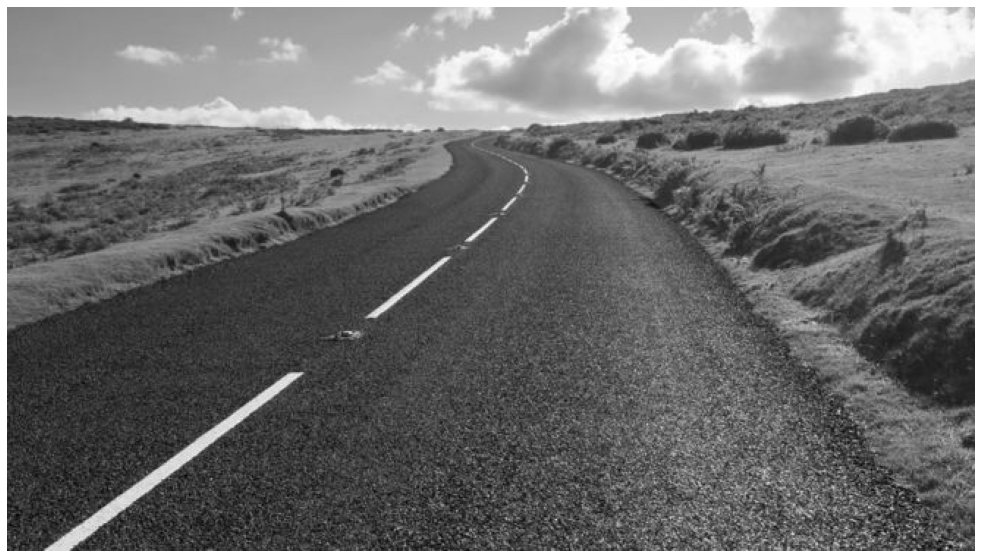

In [68]:
plot(x)

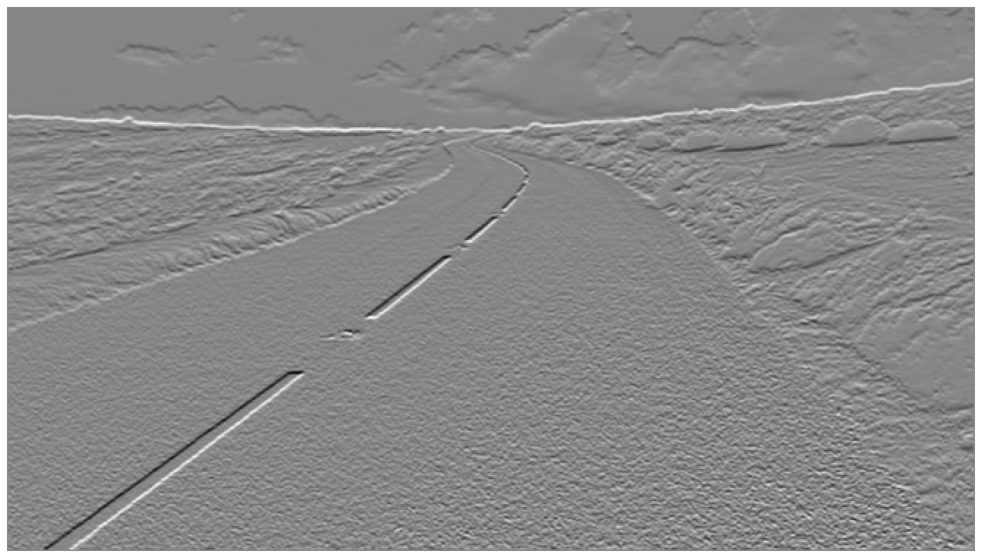

In [69]:
plot(x2)

In [70]:
def conv2(x,f):
    x2 = np.zeros(x.shape)
    for i in range(1,x.shape[0]-1):
        for j in range(1,x.shape[1]-1):
        
            x2[i,j] = f[0,0] * x[i-1,j-1] \
            +         f[0,1] * x[i-1,j] \
            +         f[0,2] * x[i-1,j+1] \
            +         f[1,0] * x[i,j-1] \
            +         f[1,1] * x[i,j] \
            +         f[1,2] * x[i,j+1] \
            +         f[2,0] * x[i+1,j-1] \
            +         f[2,1] * x[i+1,j] \
            +         f[2,2] * x[i+1,j+1]
            
    return x2

In [71]:
a=np.matrix([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
# a=np.matrix([[1,2,1],[0,0,0],[-1,-2,-1]])
# a=np.matrix([[1,1,1],[1,1,1],[1,1,1]])
# a=5*np.random.random((3,3))-5*np.random.random((3,3))

In [72]:
a

matrix([[-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]])

In [73]:
z = conv2 (x,a)

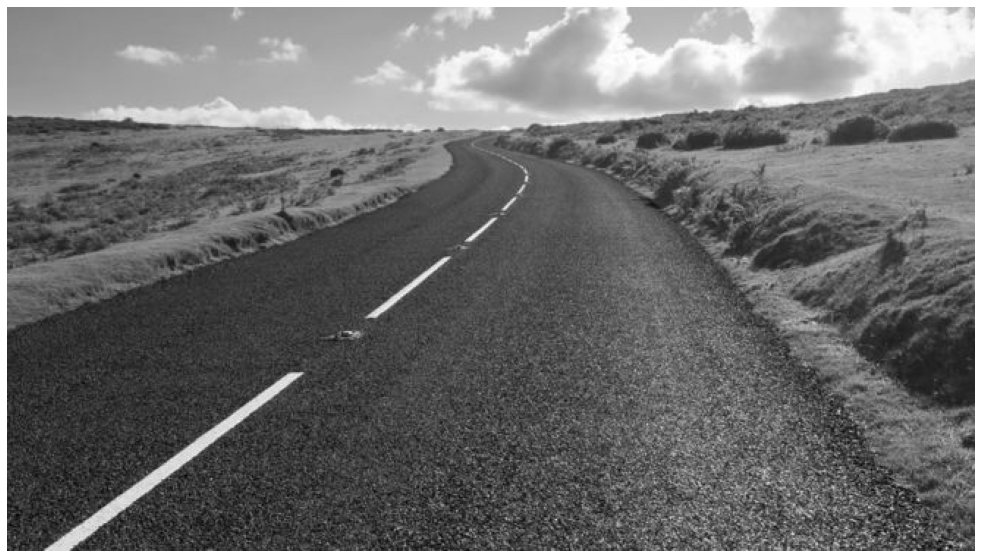

In [74]:
plot(x)

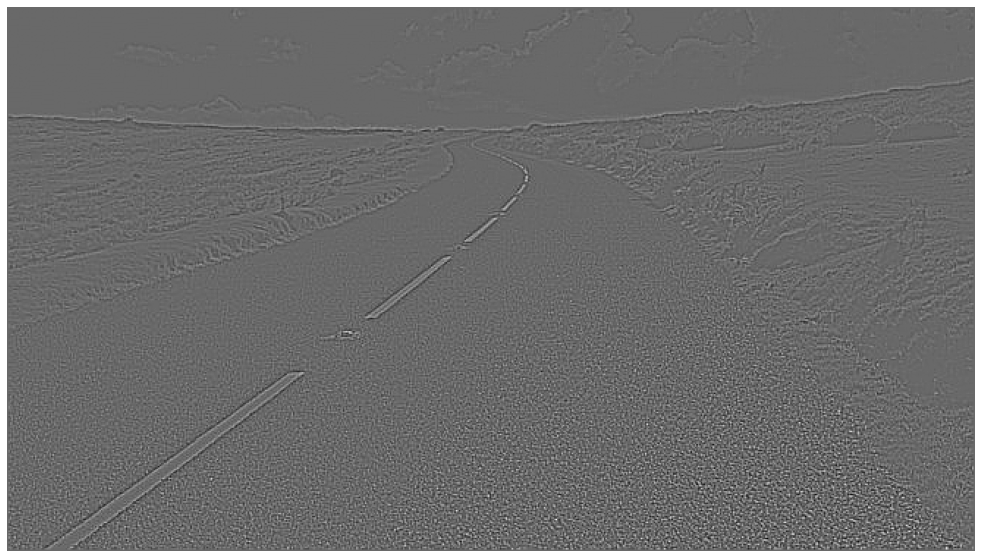

In [76]:
plot(z)

In [77]:
x

Array([[0.51350196, 0.51350196, 0.51350196, ..., 0.72996549, 0.73780784,
        0.71428078],
       [0.51350196, 0.51350196, 0.51350196, ..., 0.73275686, 0.72491451,
        0.72883569],
       [0.51742314, 0.51742314, 0.51742314, ..., 0.73465412, 0.71112706,
        0.73073294],
       ...,
       [0.33066   , 0.32281765, 0.28752706, ..., 0.31686118, 0.47370824,
        0.27764941],
       [0.19341882, 0.24047294, 0.29144824, ..., 0.26588588, 0.38744235,
        0.29725529],
       [0.09538941, 0.16597059, 0.30321176, ..., 0.18354118, 0.23843765,
        0.25412235]])

In [78]:
np.random.random((3,3))

array([[0.18848621, 0.57099086, 0.14743338],
       [0.89858989, 0.99468781, 0.7652031 ],
       [0.65409109, 0.78355392, 0.97334427]])

In [82]:
a = 2*np.random.random((3,3))-1

In [83]:
a

array([[ 0.60781483, -0.94587635, -0.38324352],
       [ 0.83943841, -0.39671544,  0.35986291],
       [ 0.99420017, -0.92466291, -0.99223365]])

In [84]:
a = np.random.random((3,3))

In [85]:
a

array([[0.26247505, 0.46021475, 0.91980935],
       [0.88447461, 0.81660226, 0.79799491],
       [0.24499193, 0.37146478, 0.22548871]])

[[ 0.80366949 -0.51743164 -0.7354709 ]
 [-0.82535784 -0.21113416 -0.4270296 ]
 [ 0.12247619  0.41101923  0.16643332]]


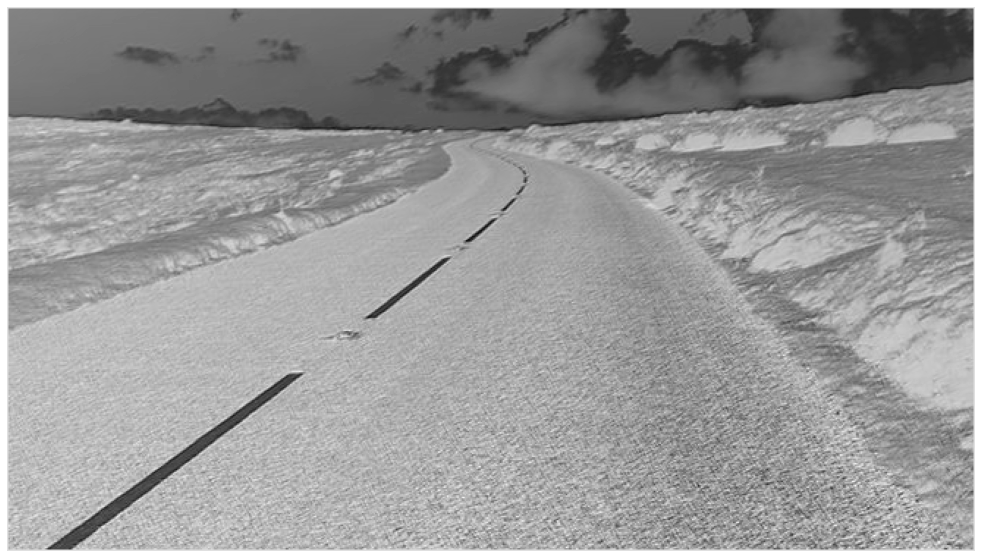

[[-0.15171604 -0.93519455 -0.81082652]
 [-0.93546069 -0.47322428 -0.517757  ]
 [-0.16843259  0.64861867  0.58748905]]


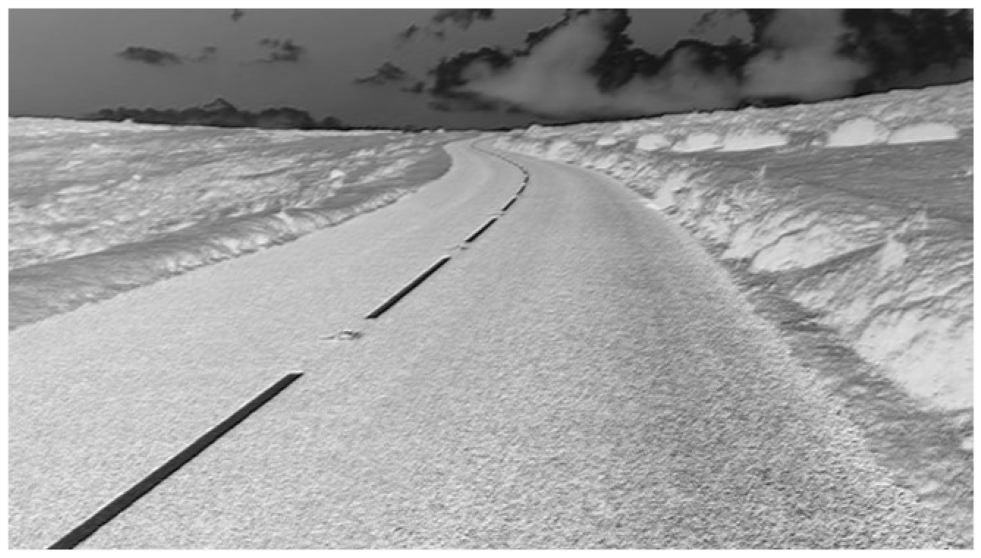

[[ 0.98092554 -0.39055887 -0.25076756]
 [ 0.07447283  0.57221333  0.93881842]
 [ 0.35852411 -0.35255894  0.52771641]]


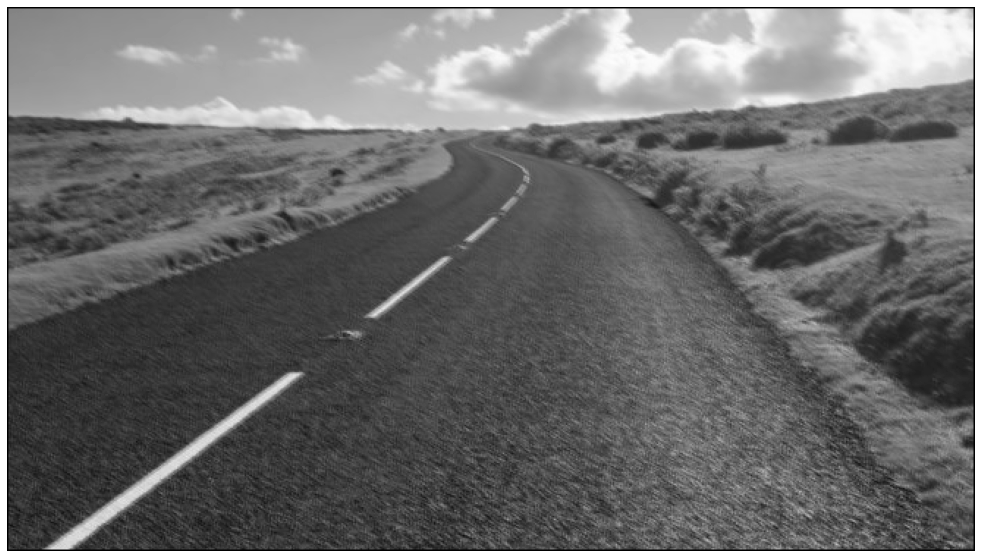

[[ 0.4789676  -0.77426808 -0.31087011]
 [-0.67308589 -0.46941835  0.43223419]
 [-0.88868633 -0.9900418   0.42509001]]


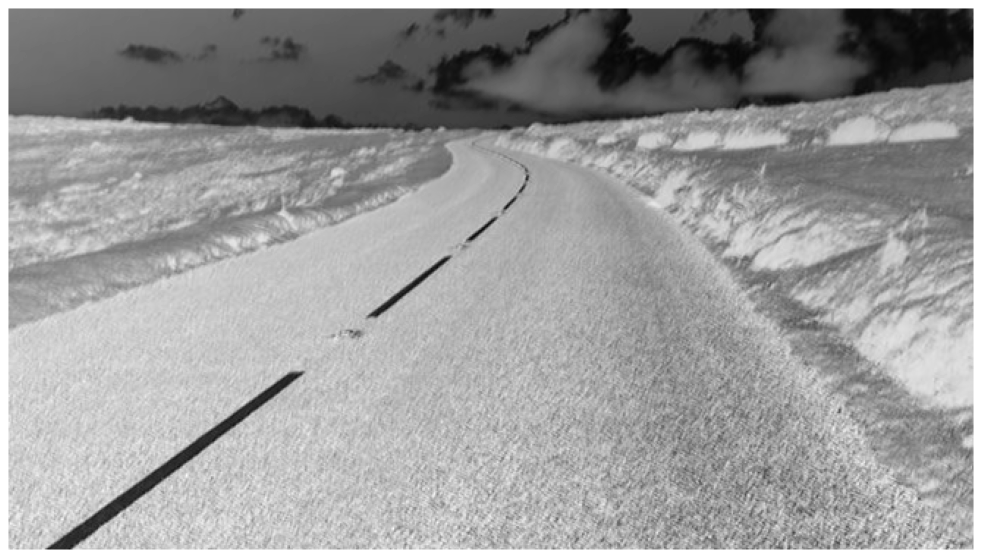

[[-0.27108069 -0.04789956 -0.00546879]
 [-0.23603314  0.05003518 -0.1435168 ]
 [-0.0952104   0.04860194 -0.13632663]]


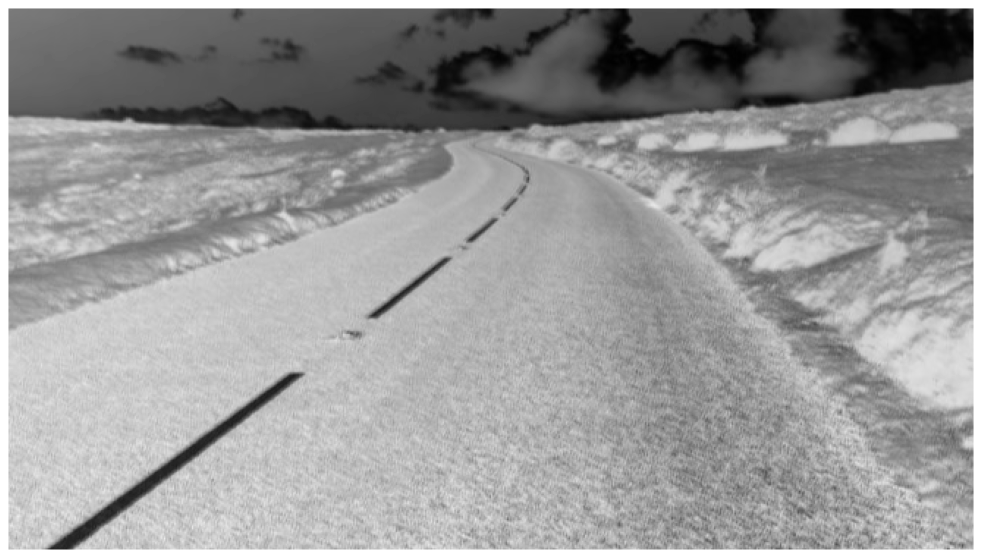

[[ 0.99265335  0.45080459 -0.3930441 ]
 [-0.27022826  0.02691009 -0.44478147]
 [ 0.22683384  0.05284675 -0.81084033]]


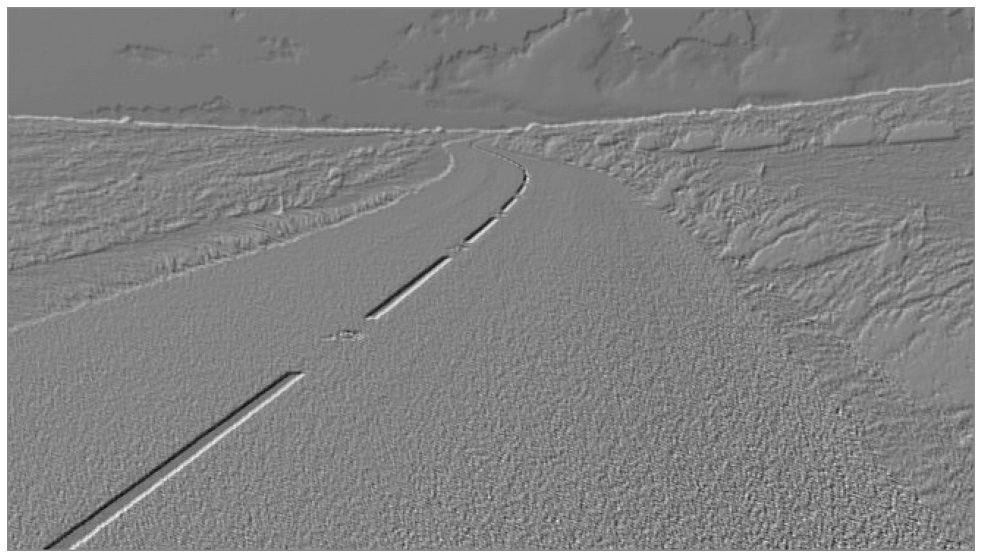

[[ 0.21517852 -0.15493097 -0.4695724 ]
 [ 0.06807498 -0.27000941  0.96517115]
 [ 0.13728307 -0.52782628  0.25135706]]


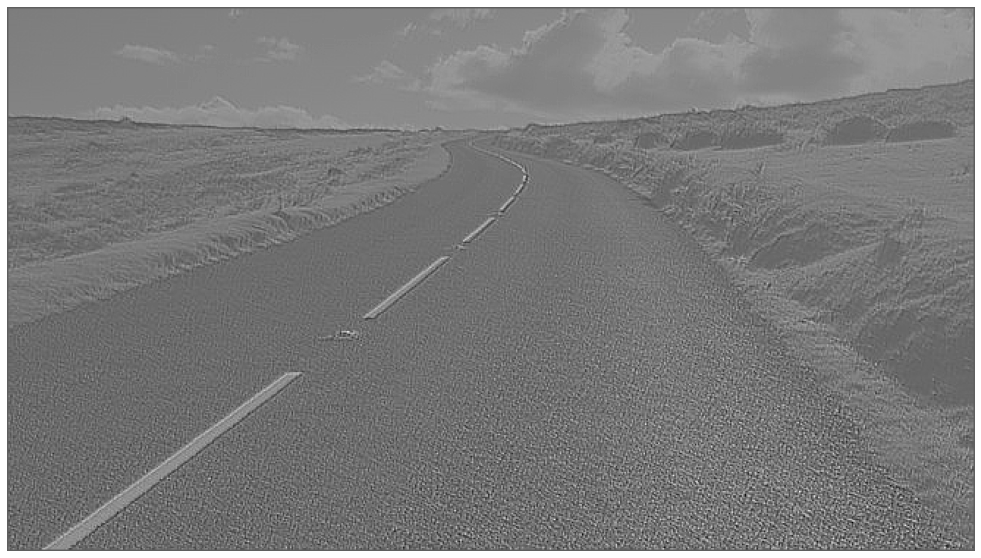

[[ 0.46425546 -0.3359674   0.13959949]
 [-0.36490361 -0.8846651  -0.11868841]
 [-0.75467829  0.0859902   0.01065099]]


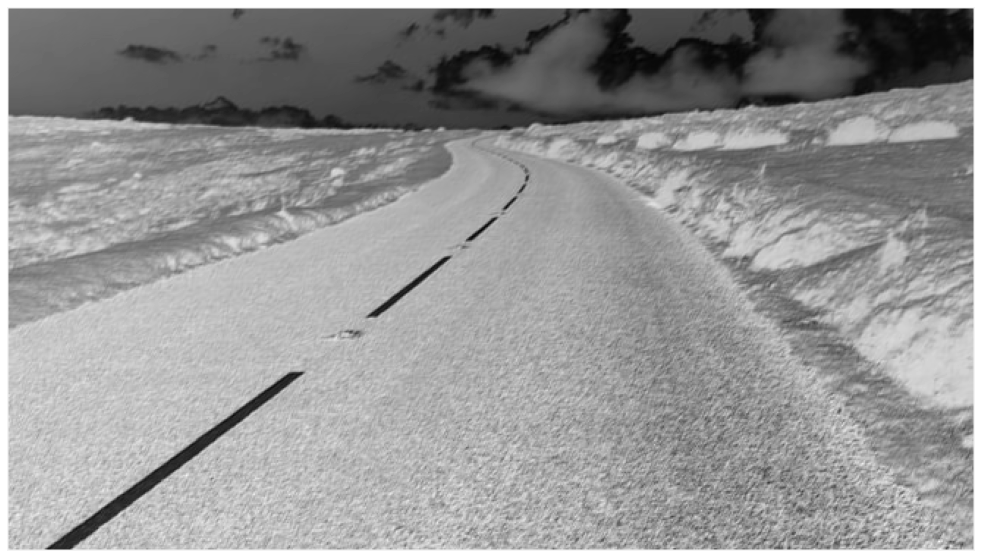

[[ 0.43879883  0.1301919   0.1548018 ]
 [-0.77577309  0.85812475 -0.23606839]
 [ 0.98107155  0.10291321 -0.35488039]]


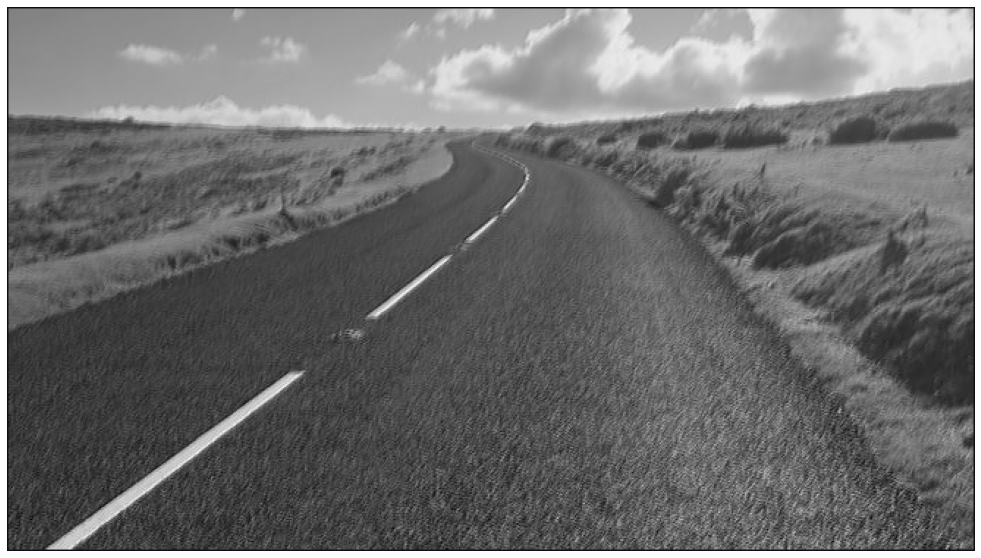

In [86]:
for i in range(9):
  a = 2*np.random.random((3,3))-1
  print(a)
  z= conv2(x,a)
  plot(z)

In [89]:
from scipy import signal

In [90]:
a = 2*np.random.random((9,3,3))-1
start_time = time.time()


NameError: ignored

In [91]:
a = 2*np.random.random((9,3,3))-1
start_time = time.time()

for i in range(9):

  z = signal.convole2d(x,a[i,:,:])


NameError: ignored